## Explore data

Data common issues:
- Consistency: typo, different languages, different scales/units, mixed types
- Accuracy: the method to collect data, features, the labels assigned
- Noisy data: outliers
- Bias data: under/over-representation of a subgroups, human biases in historical data, labeling biases
- Correlated data: highly correlated features can cause collinearity problems and numerical instability
- Missing data: some features of some samples miss the value (empty or NaN)

How to fix:
- Sanitize data: use descriptive statistics to gain insights into our data so that we can effectively clean data later. Eg: Number of rows (intances/data points), number of columns (features), etc.
- Feature statistics: mean, standard deviation, variance, minimum value, maximum value
- Multivariate statistics: multivariate statistics deal with correlations and relationships between the features. High correlation between two features can cause collinearity problems and numerical instability
    - Numerical variables' relationships: use scatter plot to spot special relationships among numerical variables
    - Correlation matrices: use scatter plot to visualize numerical variables' linear relationships. But to quantify these linear relationships, we use correlation matrix to convey both the strong and weak linear relationships among those variables. For example, if the correlation is zero, there's no linear relationship, but there still might be non-linear relationship.

In [1]:
import os
os.chdir("..")
!pwd

/c/TungGpu/ml-it/code/sagemaker-r2


In [22]:
from pathlib import Path
import numpy as np
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

## Load data

In [32]:
DATA_DIR = Path("./data")
TMP_DIR = Path("./tmp")
DATA_CSV = DATA_DIR / "full/train.csv"

In [8]:
df = pd.read_csv(DATA_CSV)
df

,0,1,2,3,4,5,6,7,8,9,...,142,143,144,145,146,147,148,149,150,target
0,0.899922,-0.161,-0.244,1.022,-0.304,-0.156,-0.310,12.06400,-0.051,462.092,...,764.3,-0.005,0.060303,13.383,0.819909,-0.18291,-0.12259,0.060684,17.1094,0
1,1.050575,-0.285,-0.298,-0.776,-0.263,-0.118,1.526,9.92919,-0.059,466.645,...,532.5,-0.023,0.044870,14.887,1.642613,-0.19030,-0.12308,0.045252,17.0932,0
2,-1.206626,-0.202,-0.289,1.099,-0.302,-0.176,-0.330,11.07720,-0.075,419.784,...,651.4,-0.035,0.054069,-2.932,0.464588,-0.18631,-0.12413,0.050065,17.2080,0
3,-1.082795,-0.125,1.748,2.167,-0.239,-0.242,-0.292,9.39798,-0.045,433.346,...,603.4,-0.008,0.043571,-44.990,0.335563,-0.19257,-0.11309,0.045097,17.5977,0
4,0.891784,-0.219,1.757,-0.782,-0.268,-0.099,-0.239,9.42913,-0.067,429.280,...,417.4,-0.025,0.041588,-12.205,-0.728111,-0.18187,-0.12143,0.043112,17.2664,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10236,0.028558,-0.249,-0.288,-1.030,-0.334,-0.073,-0.320,11.34900,-0.072,443.974,...,375.9,-0.051,0.049026,1.273,-0.533203,-0.18568,-0.11735,0.053982,17.1961,3
10237,-0.288804,-0.249,-0.288,-1.030,-0.334,-0.073,-0.320,12.03610,-0.072,450.603,...,389.9,-0.051,0.054744,-29.510,-0.725361,-0.21962,-0.11697,0.059700,16.9488,3
10238,0.073675,-0.249,-0.288,-1.030,-0.334,-0.073,-0.320,10.44560,-0.072,427.511,...,625.4,-0.051,0.046761,13.455,-1.775220,-0.18374,-0.11664,0.045234,16.9493,1
10239,-0.053419,-0.191,1.505,1.110,2.209,-0.062,-0.349,10.91210,-0.125,424.143,...,865.1,-0.015,0.054070,-15.422,1.265340,-0.18110,-0.12317,0.052165,16.9989,1


## Sanitize data by checking feature statistics

In [9]:
pd.set_option('display.max_columns', None)

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10241 entries, 0 to 10240
Columns: 152 entries, 0 to target
dtypes: float64(143), int64(9)
memory usage: 11.9 MB


In [10]:
df.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,target
count,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10224.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10229.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10232.000000,10241.000000,10241.000000,10241.000000,10241.000000,10185.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10237.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.00000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000,10241.000000
mean,0.127977,-0.018351,-0.045335,-0.016402,0.074057,0.004281,-0.007069,10.162148,-0.037253,440.690561,0.029022,1.295237,5.554926,0.003297,-0.019323,24805.348892,-0.006271,-0.021998,-0.021107,0.999999,100.759386,73.867717,0.078163,815.804023,0.000021,-0.005911,0.800015,-0.011853,-0.022019,-0.016284,-0.014501,0.003788,0.666202,-0.013871,-0.022586,3226.648746,-0.028186,-0.039001,0.002625,0.045210,0.000303,0.133723,94.360955,0.092128,0.112985,-0.016920,-0.026017,-18.423399,96.528978,1.500109,749.966355,-0.004967,-0.024786,-0.028969,0.180086,-3.286689,465.471530,0.144799,5274.860454,-0.027518,95.659092,0.995531,-0.002773,-0.011204,3.236305,0.003328,66712.538580,0.000004,-0.009744,3.459363,0.000004,0.180266,-0.023024,-181.609155,-0.000021,-0.128154,-0.002770,-0.000006,0.033116,5079.200093,-0.002410,-0.014035,-0.091643,1.200283,0.038069,-0.009836,-0.026143,21.742855,-0.001472,0.003306,3023.987513,-0.003670,853.508739,0.480110,0.067494,138.846109,-0.119871,3.100002,0.323206,0.003242,0.196976,1.499989,-0.019886,3.099975,0.000023,-0.190249,-0.120047,-0.120041,194.516077,1970.608280,0.035058,3.460312,7.796651,7.571917,-0.025756,-0.028353,0.000086,-0.004557,1.160083,21.715196,1.08179,0.000133,-0.015463,-0.009001,0.004068,6754.334847,1.199946,2384.223318,1.095981,0.199933,-0.000062,0.095912,0.014774,-0.024326,1.081765,-0.025623,-0.000045,0.057776,0.481159,-0.012822,66286.257035,-0.003164,671.230407,-0.021312,0.050167,-7.314472,-0.003216,-0.195913,-0.120027,0.050307,17.452579,0.047945
std,2.018572,0.59784

### Check missing data

In [68]:
# Count NaN in df
df.isnull().sum().sum()

98

In [51]:
na_count_df = df.isna().sum().to_frame().T
na_count_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,target
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,17,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12,0,0,0,0,0,9,0,0,0,0,56,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [62]:
na_col = [col for col in na_count_df.columns if any(na_count_df[col]) > 0]
na_col

['40', '69', '75', '80', '111']

In [64]:
na_count_df[na_col]

,40,69,75,80,111
0,17,12,9,56,4


**NOTE**: Need to fill NaN values!

### Check labeling biases

In [73]:
# Check target validity
df['target'].isnull().sum()

0

In [71]:
# Count unique values
df['target'].nunique()

5

In [81]:
value_counts = df['target'].value_counts().to_frame().T
value_counts

,0,1,2,3,4
target,10000,101,59,52,29


<AxesSubplot:ylabel='Frequency'>

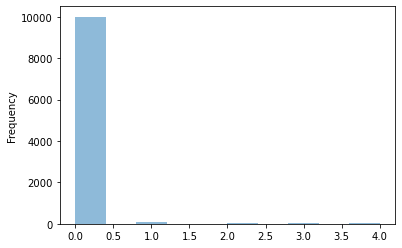

In [84]:
df['target'].plot.hist(alpha=0.5)

**NOTE**: The labels are very unimbalanced! Need to oversampling some labels!

## Check feature correlations by using multivariate statistics

### Correlation matrices

In [12]:
corr_mat = df.corr()
corr_mat

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,target
0,1.000000,0.002652,-0.010912,0.038575,0.050106,0.008386,0.002332,0.170790,0.009473,0.164587,-0.007618,0.261024,0.109955,0.021635,-0.014751,0.081649,-0.071848,-0.018244,0.470127,-0.012236,-0.073333,0.034046,-0.056044,0.095244,0.000950,0.086956,-0.012805,0.008715,0.013361,0.002111,0.009097,-0.011787,-0.035541,0.003714,0.014337,0.259601,-0.032130,0.014892,-0.005518,0.032701,-0.005412,0.000746,0.045098,-0.031787,-0.044177,0.007246,-0.013420,-0.401362,-0.123874,-0.014204,0.405458,0.055415,-0.031899,0.011842,-0.005499,-0.003057,0.135346,-0.064937,0.260047,-0.009437,-0.124923,0.018270,-0.000517,-0.076852,0.061607,0.019158,0.157882,-0.005514,0.044587,-0.006443,-0.003097,-0.006390,-0.004777,-0.372667,0.001685,-0.010018,-0.008170,0.009582,0.012381,0.261963,0.015483,0.008841,-0.032239,-0.006505,-0.042790,0.046950,-0.002244,-0.174969,-0.022197,0.018609,0.346333,0.000352,0.093999,0.011963,0.003975,0.022912,-0.006700,0.003491,0.065156,0.013625,0.063262,-0.014855,-0.001691,0.004286,-0.026421,0.002763,-0.001954,-0.008070,0.094847,0.355632,-0.025596,0.000987,-0.006715,0.016033,-0.003968,0.008903,-0.013082,0.034914,0.018140,-0.176595,-0.078473,0.010039,0.028911,0.025857,-0.023422,0.085774,0.000052,-0.065032,-0.100258,0.014720,0.006206,-0.099499,0.005359,0.120467,-0.063770,-0.010392,-0.002181,0.075143,0.000059,0.003811,0.153747,-0.003574,0.001103,-0.003026,0.156966,0.039079,0.046398,-0.000989,-0.007058,0.154031,-0.186368,0.222683
1,0.002652,1.000000,0.025079,-0.019532,0.057252,0.026692,0.009735,0.003058,-0.002971,0.077088,0.019708,-0.006213,0.032433,-0.030687,0.029051,-0.003030,0.010243,0.039391,0.000162,-0.005353,0.086362,-0.043439,0.041700,0.011799,0.004479,0.002273,0.013453,0.022535,0.035608,0.019149,-0.020100,0.014866,0.050448,0.010315,0.035213,-0.010201,0.034736,0.000913,0.040933,0.037946,0.004140,-0.015962,-0.030966,0.045787,0.046906,0.009171,0.010420,-0.029449,0.034133,0.006002,0.002827,-0.019096,0.001054,0.006761,0.001631,-0.003990,0.082802,0.013793,0.015789,-0.016817,0.033632,-0.000518,-0.003914,0.053651,-0.006231,-0.004082,-0.007478,0.009692,-0.031584,-0.009493,0.020991,-0.001044,0.021012,-0.000471,-0.002720,-0.016729,0.000617,0.003770,-0.029454,0.015825,0.001656,0.022499,-0.017103,-0.006017,-0.001890,0.016679,-0.002753,0.000514,0.017778,0.007238,-0.005625,0.001074,0.014241,-0.004830,0.031547,0.010679,0.016706,0.015292,0.049713,0.000032,0.041346,0.005079,0.006795,-0.007626,-0.003622,-0.005076,0.020943,0.014609,0.043972,0.011189,0.031871,0.012977,0.005787,0.005161,-0.006385,0.007034,-0.008378,0.027339,-0.005761,0.000195,0.027258,0.019588,0.014192,0.053650,0.019978,0.025734,0.011596,0.062676,-0.008829,0.004141,-0.003782,0.051409,-0.000185,-0.011493,0.005101,-0.009240,-0.001880,0.039648,-0.001426,0.007202,-0.002657,0.013018,-0.021932,0.023909,-0.010128,0.030099,0.017664,-0.007949,0.017670,0.002905,0.003298,0.044198
2,-0.010912,0.025079,1.000000,-0.022597,0.025652,0.062363,0.029748,-0.014507,0.004909,0.035047,0.056047,0.002963,-0.023937,-0.019292,0.094615,0.093740,-0.005871,0.022249,-0.011202,-0.011263,0.120205,-0.032006,0.215724,0.229380,-0.001059,-0.011561,-0.001423,-0.011066,0.012263,-0.003315,-0.011958,0.018685,0.086480,0.012586,0.062446,0.006341,0.026502,0.019496,-0.004791,0.083055,0.008704,-0.009672,-0.023149,0.050419,0.058175,0.030938,0.027392,-0.005971,-0.015840,-0.010837,0.005371,-0.019087,0.002590,0.022466,-0.008115,-0.004215,0.046096,0.024616,0.011626,0.003633,-0.015555,-0.012798,0.012287,0.132297,0.008795,-0.013163,0.007010,-0.010809,

In [106]:
sn.set(rc={'figure.facecolor':'white'})

In [108]:
# input_corr_mat = corr_mat.iloc[:10, :10]
input_corr_mat = corr_mat # Takes ~3 minutes

fig, ax = plt.subplots(figsize=(300,300))
sn.heatmap(input_corr_mat, annot=True, ax=ax,
           annot_kws={"size": 200 / np.sqrt(len(input_corr_mat))})
plt.savefig(TMP_DIR / 'exp-01-corr_mat.png')

**NOTE**: Check the image in the `tmp` folder. There're some features that have high correlation (absolute value > 0.8). Check this [link](https://statisticsbyjim.com/basics/correlations/) on how to interprete correlations.

Need to drop highly correlated features!

### Pair plots

In [112]:
# input_pair_plot = df.iloc[:5, :5]
input_pair_plot = df.iloc[:, :5] # ~3 minutes
# input_pair_plot = df # Takes ~20 minutes

g = sn.pairplot(input_pair_plot, diag_kind="kde", corner=True)
g.fig.set_size_inches(300,300)
plt.savefig(TMP_DIR / 'exp-01-pair_plot.png')